In [1]:
using PyCall
using IJulia
using FFTW, ImageFiltering
using Pkg
using LinearAlgebra
using FFTW
using DelimitedFiles
using Distributions, Plots, SymPy
using FileIO, CSVFiles, DataFrames

┌ Info: Recompiling stale cache file /home/nareg/.julia/compiled/v1.2/PyCall/GkzkC.ji for PyCall [438e738f-606a-5dbb-bf0a-cddfbfd45ab0]
└ @ Base loading.jl:1240
┌ Info: Recompiling stale cache file /home/nareg/.julia/compiled/v1.2/SymPy/KzewI.ji for SymPy [24249f21-da20-56a4-8eb1-6a02cf4ae2e6]
└ @ Base loading.jl:1240


In [20]:
np = pyimport("numpy")

PyObject <module 'numpy' from '/home/nareg/anaconda3/lib/python3.6/site-packages/numpy/__init__.py'>

# Single Frequency Matched Filtering

\begin{equation}
\large
\Psi(k) = \frac{P^{-1}(k)F(k)}{\int d ^2 k F^{T}(k)P^{-1}(k)F(k)}
\end{equation}

In [2]:
function τ(x, y, rc, c)
    
    c_ = c
    X_ = [x, y]
    
    r = sqrt(sum(@. (X_ - c_)^2))
    
    return  (1 + (r/rc)^2)^(-1.0)
    
end

τ (generic function with 1 method)

In [121]:
# Simulate data
npix = 1024

x_ = range(1, stop = npix, length = npix)    # Or this way! -9.0:0.01:9.0
y_ = range(1, stop = npix, length = npix)

template = Matrix{Float64}(undef, length(x_), length(y_))

M2 = Matrix{Float64}(undef, length(x_), length(y_))
M3 = Matrix{Float64}(undef, length(x_), length(y_))
M4 = Matrix{Float64}(undef, length(x_), length(y_))

for i in 1:length(x_), j in 1:length(y_)
    
    template[i, j] = τ(x_[i], y_[j], 15, [npix/2, npix/2])
    M2[i, j] = τ(x_[i], y_[j], 17, [102, 225.21])
    M3[i, j] = τ(x_[i], y_[j], 13.5, [502, 725.21])
    M4[i, j] = τ(x_[i], y_[j], 42.5, [832, 325.21])
    
end

In [122]:
# Define Normal noise
d = Normal(0.0, 1.0)
noise = 2.0 * rand(d, size(template))

# Combine clusters and noise to simulate map
data_ = M3 + M2 + M4 + noise;

In [123]:
final_plot = [heatmap(noise, c=:balance, title = "Noise"), heatmap(M3 + M2 + M4, c=:balance, title = "Clusters"),
              heatmap(data_, c=:balance, title = "Noise + Clusters")]

plot(final_plot..., layout = (1, 3), size = (950, 300), colorbar = false)

In [124]:
# Numpy.trapz type trapezoidal integration
function tpz(V)
    
    sum = 0.0
    
    for i in 1:length(V)
        
        if i == 1 || i == length(V)
            
            sum += V[i]
                    
        else
            
            sum += 2 * V[i]
            
        end
        
    end    
    
    return 0.5 * sum
        
end


function tpz2d(X)
    
    #=
    Calcuate two dimensional integral
    =#
    
    tpz([tpz((X)[:, i]) for i in 1:size(X)[1]])
    
end

tpz2d (generic function with 1 method)

In [125]:
# Compare tpz with numpy.trapz
# Random 1d and 2d data
v = 10 * randn(12)
M = 10 * randn(12, 12)

println("Python: ", np.trapz(v))
println("Julia: ", tpz(v))

# 2D case
println("Python: ", np.trapz(np.trapz(M)))
println("Julia: ", tpz2d(M))

Python: 14.276597150995675
Julia: 14.276597150995674
Python: -5.288236905524322
Julia: -5.288236905524332


In [149]:
function ψ(map, template)
    
    PSbm = broadcast(abs, (fftshift(fft(map/length(map))))).^2
    PSbm = imfilter(PSbm, Kernel.gaussian(1))
    t_k = fftshift(fft(template/length(template)))
    
    Psi_k = @. t_k / PSbm
    norm_ = tpz2d(@. t_k^2 / PSbm) # tpz([tpz((t_k.^2 ./ PSbm)[:, i]) for i in 1:size(Psi_k)[1]])
    
    return Psi_k/norm_
    
end

ψ (generic function with 1 method)

In [150]:
image_k = fftshift(fft(data_/length(data_)))
F = ψ(data_, template)
mmf = ifftshift(broadcast(real, ifft(ifftshift(@. F * image_k)))) * npix^2;

In [151]:
final_plot = [heatmap(noise, c=:balance, title = "Noise"), heatmap(M3 + M2 + M4, c=:balance, title = "Clusters"),
              heatmap(data_, c=:balance, title = "Noise + Clusters"), heatmap(mmf, c=:balance, title = "Filtered Map")]

plot(final_plot..., layout = (2, 2), size = (630, 500), colorbar = true)

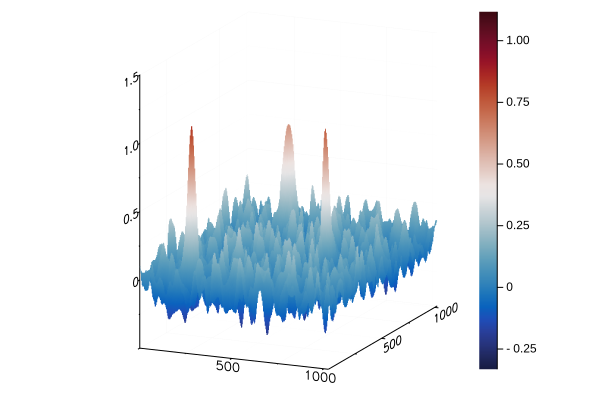

In [152]:
surface(x_, y_, mmf, c=:balance)

---

# Radial Map

In [200]:
npix = 512

x_ = range(1, stop = npix, length = npix)    # Or this way! -9.0:0.01:9.0
y_ = range(1, stop = npix, length = npix)

img = Matrix{Float64}(undef, length(x_), length(y_))

for i in 1:length(x_), j in 1:length(y_)
    
    img[i, j] = τ(x_[i], y_[j], 85, [npix/2, npix/2])
    
end

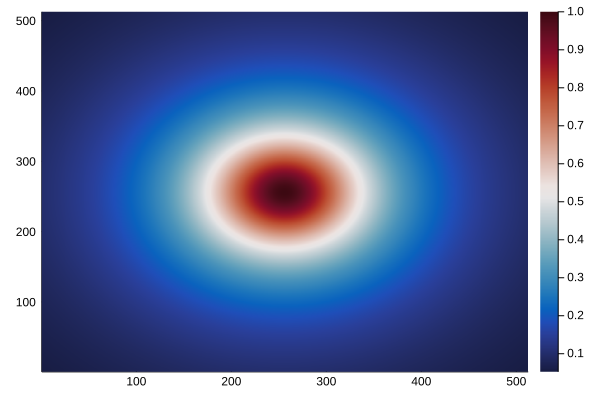

In [201]:
heatmap(img, c=:balance)

In [202]:
r = zeros(512, 512)
inds = CartesianIndices((512, 512))
Tuple.(inds)

for i in 1:512, j in 1:512
    
    idx = getindex(inds, i, j)
    r[i, j] = sqrt((idx[1] - 512/2)^2 + (idx[2] - 512/2)^2)

end

r = floor.(Int, r);

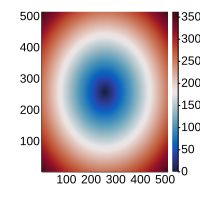

In [203]:
heatmap(r, c =:balance, size = (200, 200))

In [204]:
# A function to replicate numpy.ravel
function ravel(X)
    
    X_r = []
    X_t = transpose(X)
        
    for i in 1:length(X)
        
        push!(X_r, X_t[i])
        
    end
    
    return X_r

end


# A function to replicate numpy.bincount
function bincount(X; weights = nothing)
    
    X_bin = []
    
    if weights == nothing
        
        for i in 1:maximum(X)

            if i in X

                push!(X_bin, sum((@. X == i)))

            elseif !(i in X)

                push!(X_bin, 0)

            end

        end
        
    elseif !(weights == nothing)
        
        for i in 1:maximum(X)
    
            if i in X
            
                push!(X_bin, sum((@. X == i) .* weights))
    
            elseif !(i in X)
        
                push!(X_bin, 0)

            end
    
        end
        
    end
    
    return X_bin
    
end

bincount (generic function with 1 method)

In [205]:
img_ravel = ravel(img)
r_ravel = ravel(r)

tbin = bincount(r_ravel, weights = img_ravel)
nr = bincount(r_ravel)

radil_profile = @. tbin/nr;

In [206]:
size(tbin)

(362,)

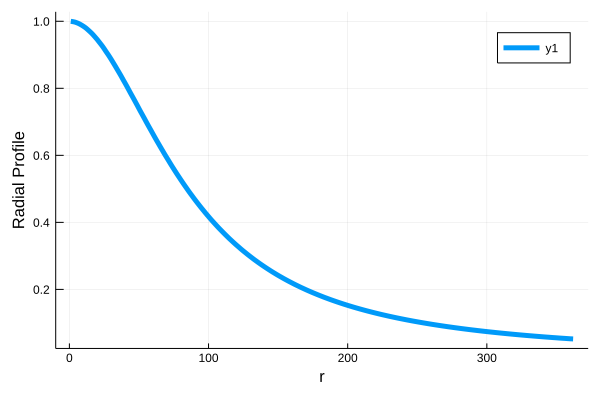

In [207]:
plot(radil_profile, lw = 5,
     xlabel = "r", ylabel = "Radial Profile")